In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]=""

import tensorflow as tf
from src import vrae, train, utils
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)
for gpu in physical_devices:
    tf.config.experimental.set_memory_growth(gpu, True)

[]


In [2]:
def tensorset(arr, shape, batch_size, drop_remainder=True):
    # type casting & reshaping
    data = arr.astype(np.float32)
    print("Before reshape : {}".format(data.shape))
    data = np.reshape(data, shape)
    print("After reshape : {} | data type : {}".format(data.shape, data.dtype))
    # make to tensor
    ds = tf.data.Dataset.from_tensor_slices(data)
    ds = ds.batch(batch_size, drop_remainder=drop_remainder)
    return ds

# Train Data Load

In [3]:
batch_size = 32
train_set = np.load('/works/Data/wellysis/preprocessed/5s_mit_minmax_30000_train.npy')
print("Total Data Set shape is : {}".format(train_set.shape))
time_size = train_set.shape[1]
print(train_set.min(), train_set.max(), train_set.mean(), train_set.std())
train_set = tensorset(arr = train_set, shape=(-1, time_size, 1), batch_size=batch_size)

Total Data Set shape is : (30000, 640, 1)
0.0 1.0 0.5113967094006754 0.0580595980601414
Before reshape : (30000, 640, 1)
After reshape : (30000, 640, 1) | data type : float32


In [4]:
batch_size = 32
#time_size = 256*5
test_set = np.load('/works/Data/wellysis/preprocessed/5s_mit_minmax_30000_test.npy')
print("Total Data Set shape is : {}".format(test_set.shape))
print(test_set.min(), test_set.max(), test_set.mean(), test_set.std())
test_set = tensorset(arr = test_set, shape=(-1, time_size, 1), batch_size=batch_size)

Total Data Set shape is : (30000, 640, 1)
0.0 1.0 0.4741738694138624 0.08569976213896564
Before reshape : (30000, 640, 1)
After reshape : (30000, 640, 1) | data type : float32


# Model Load

In [5]:
from src import cnn_ae

model = cnn_ae.VGG16_AE(T=640, latent_dims=32)
model.summary()

Model: "VGG16_AE"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inputs (InputLayer)          [(None, 640, 1)]          0         
_________________________________________________________________
Encoder_Module (Functional)  (None, 32)                3201888   
_________________________________________________________________
Decoder_Module (Functional)  (None, 640, 1)            2550545   
Total params: 5,752,433
Trainable params: 5,752,433
Non-trainable params: 0
_________________________________________________________________


In [6]:
model.load_weights("/works/GitLab/jomjam/Python/AnomalyDetection/ECG/save/20210827_19_07_17_5s_mit_cnn_ae_32latent_gauss_bat128_lr1e6/save")

# Reconstruct 확인

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

# Train Data Reconstruct

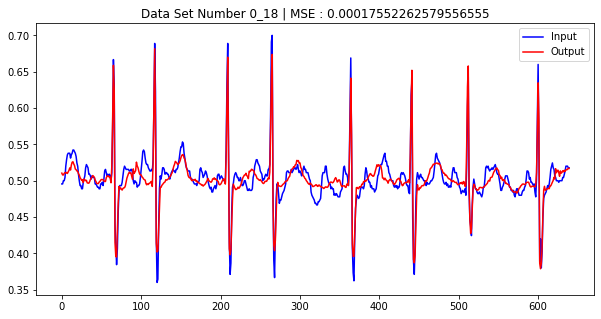

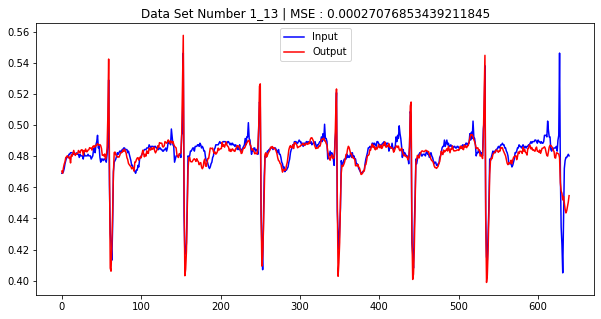

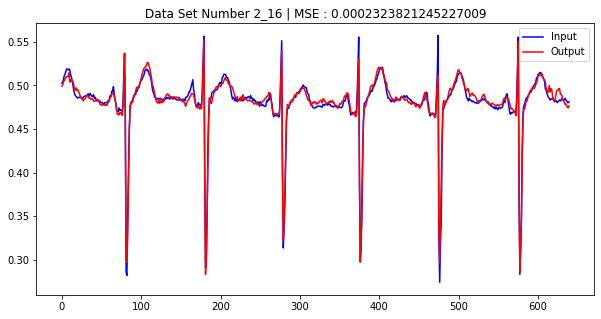

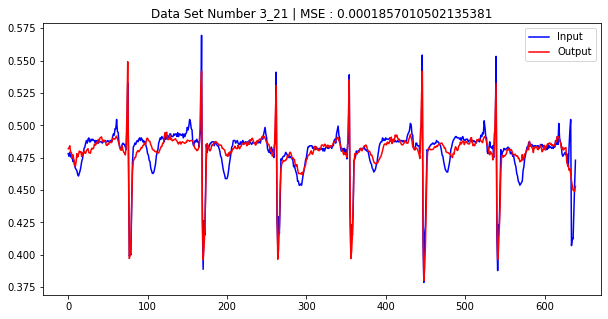

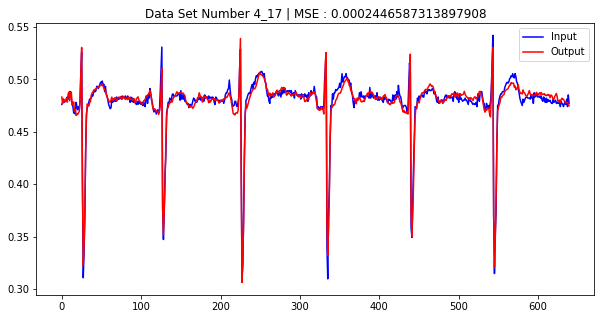

...

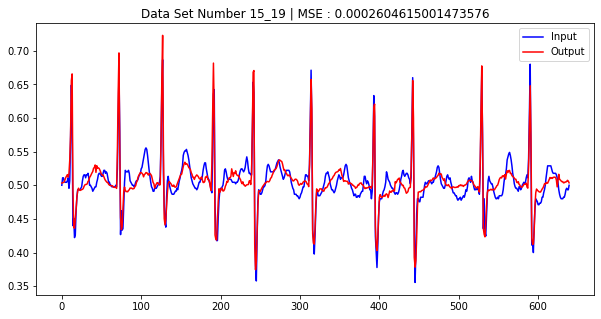

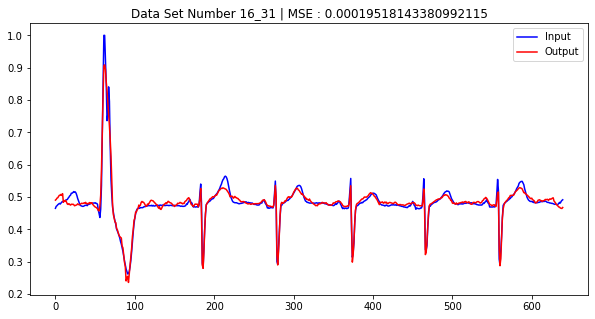

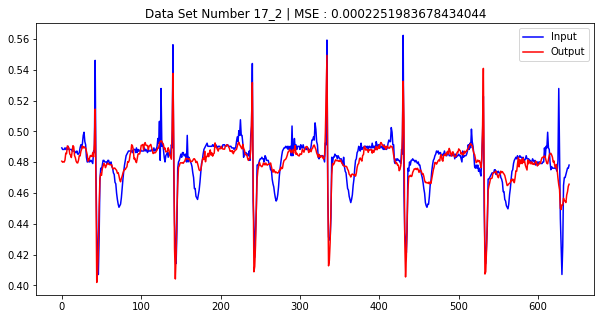

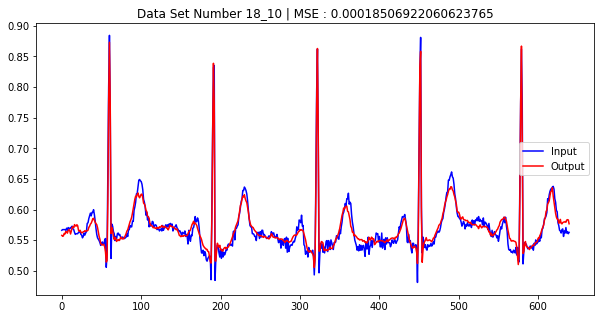

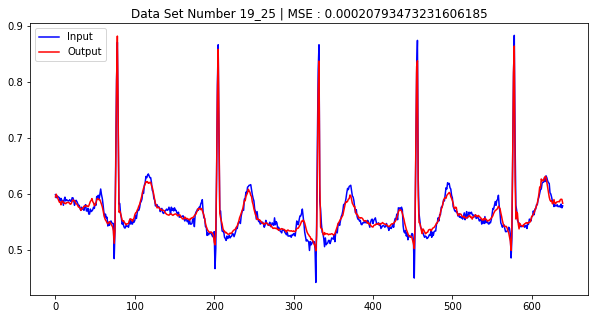

In [100]:
show_num = 20
show_idx = 0

for x in train_set:
    output, _ = model(x)
    x_arr = x.numpy().reshape(batch_size, time_size)
    y_arr = output.numpy().reshape(batch_size, time_size)
    mse = np.mean(np.square(x_arr-y_arr))
    random_idx = np.random.permutation(x_arr.shape[0])[0]
    
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    ax.plot(np.arange(time_size), x_arr[random_idx], label="Input", color="b")
    ax.plot(np.arange(time_size), y_arr[random_idx], label="Output", color="r")
    ax.legend()
    ax.set_title("Data Set Number {}_{} | MSE : {}".format(show_idx, random_idx, mse))
    plt.show()
    
    show_idx += 1
    
    if show_idx == show_num:
        break

# Test Data Reconstruct

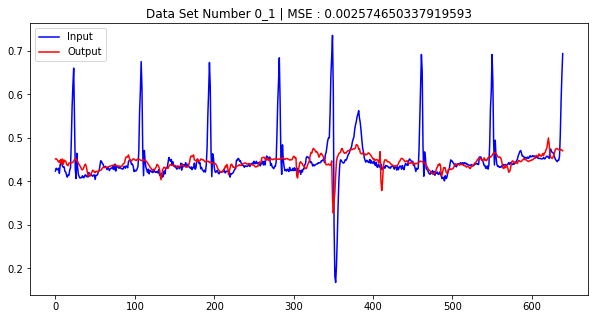

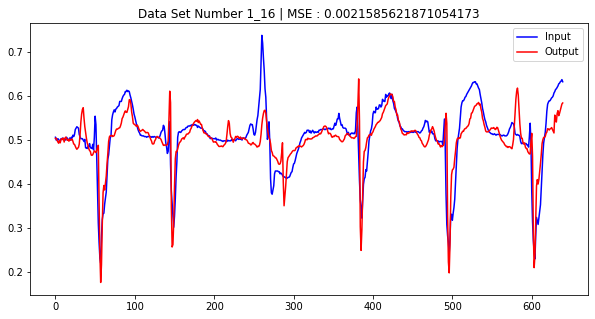

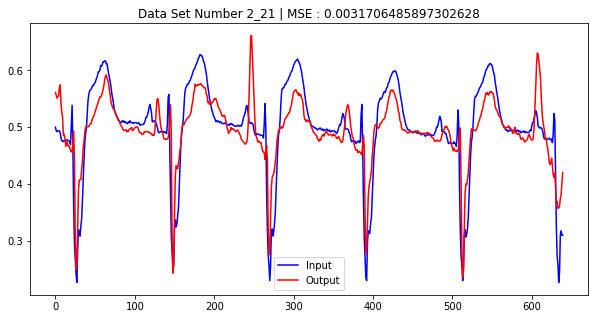

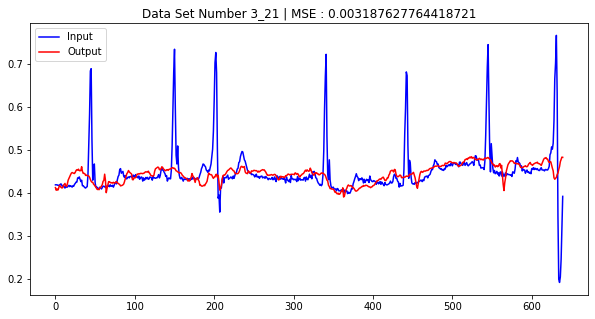

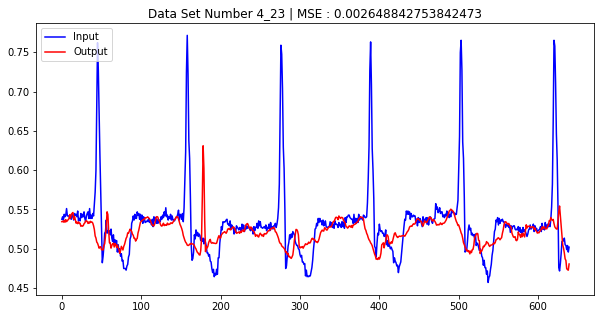

...

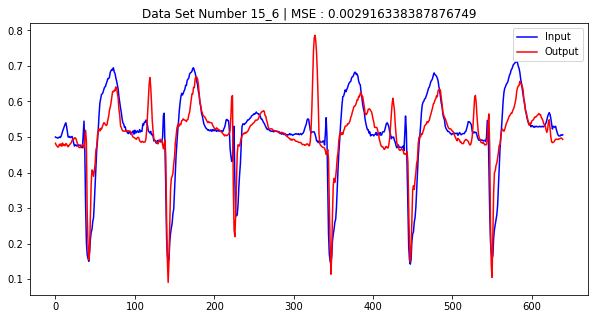

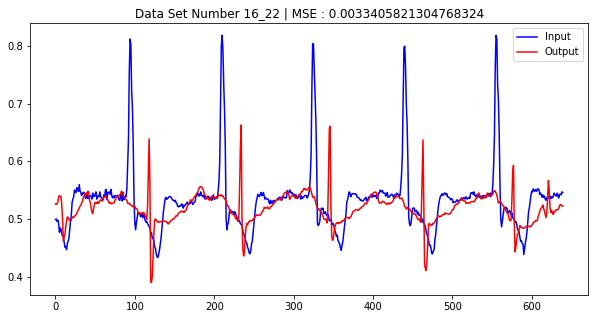

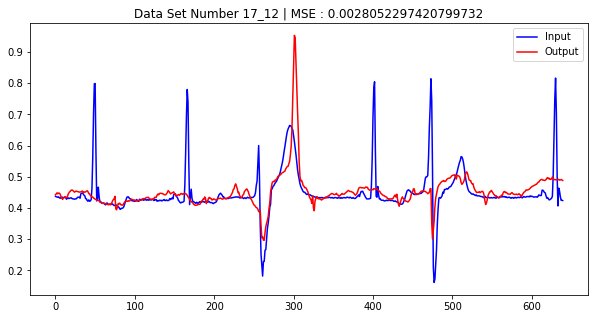

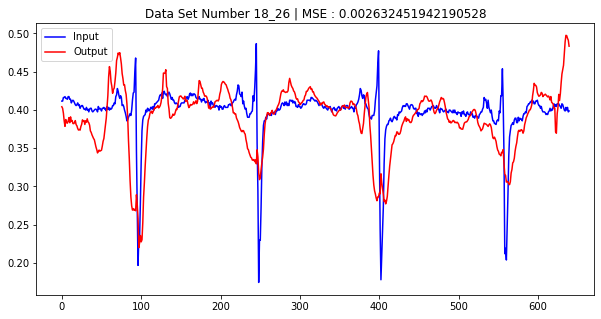

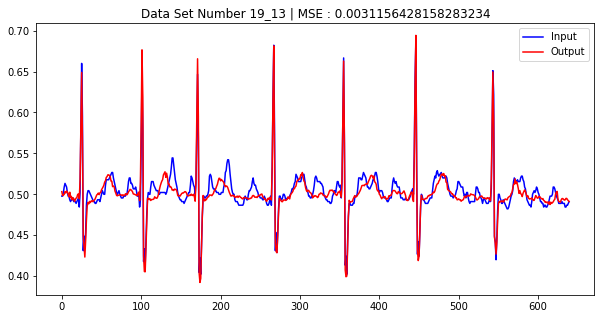

In [99]:
show_num = 20
show_idx = 0

for x in test_set:
    output, _ = model(x)
    x_arr = x.numpy().reshape(batch_size, time_size)
    y_arr = output.numpy().reshape(batch_size, time_size)
    mse = np.mean(np.square(x_arr-y_arr))
    random_idx = np.random.permutation(x_arr.shape[0])[0]
    
    fig = plt.figure(figsize=(10,5))
    ax = fig.add_subplot(111)
    ax.plot(np.arange(time_size), x_arr[random_idx], label="Input", color="b")
    ax.plot(np.arange(time_size), y_arr[random_idx], label="Output", color="r")
    ax.legend()
    ax.set_title("Data Set Number {}_{} | MSE : {}".format(show_idx, random_idx, mse))
    plt.show()
    
    show_idx += 1
    
    if show_idx == show_num:
        break
        

# Latent

In [10]:
def make_latent_set(model, data_set):
    base_arr = np.zeros((1, 32), dtype=np.float32)
    for x in data_set:
        outputs, latent = model(x)
        latent_arr = latent.numpy()
        base_arr = np.concatenate((base_arr, latent_arr), axis=0)
    base_arr = base_arr[1:]
    print(base_arr.shape)
    return base_arr

In [75]:
train_latent_arr = make_latent_set(model, train_set)
test_latent_arr = make_latent_set(model, test_set)

(29984, 32)
(29984, 32)


# In Train

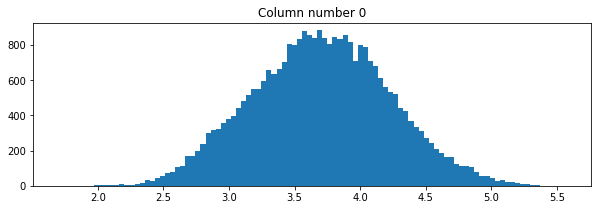

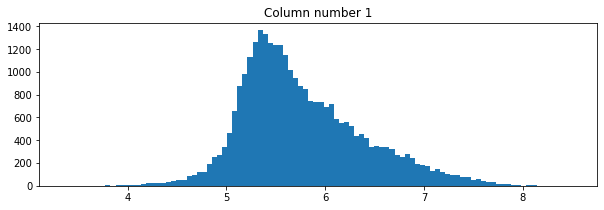

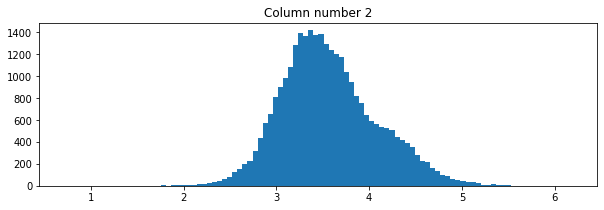

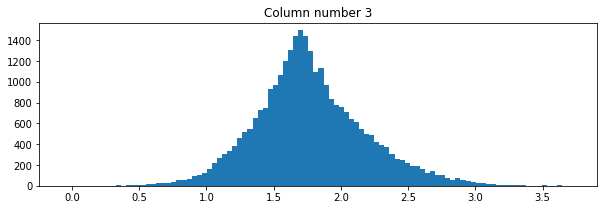

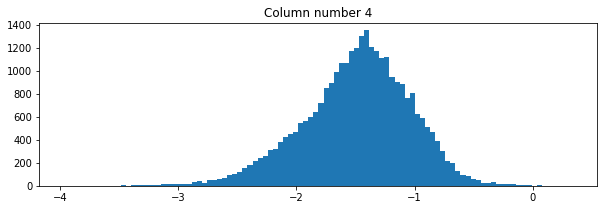

...

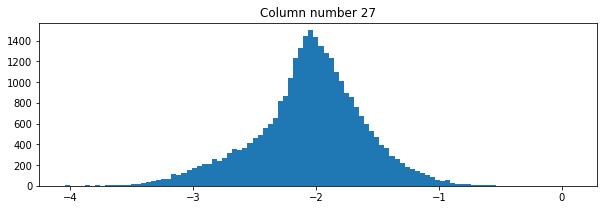

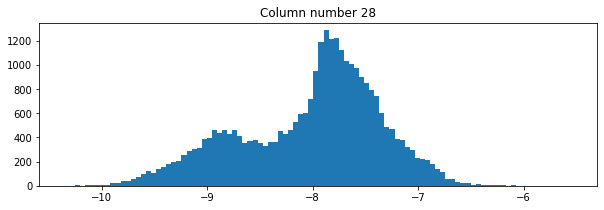

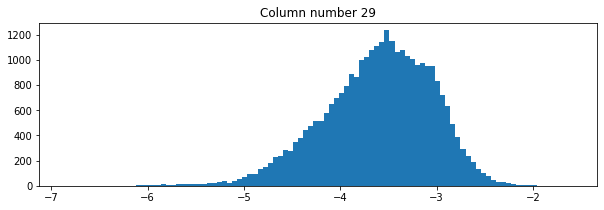

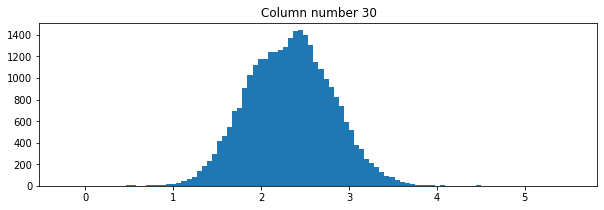

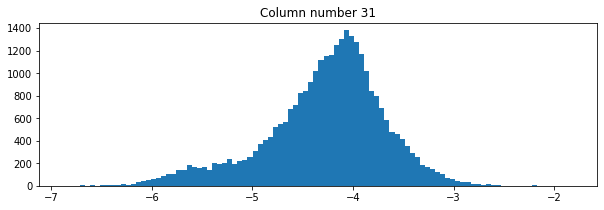

In [12]:
for idx in range(train_latent_arr.shape[1]):
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot(111)
    ax.hist(train_latent_arr[:,idx], bins=100)
    ax.set_title("Column number {}".format(idx))
    plt.show()

# In Test

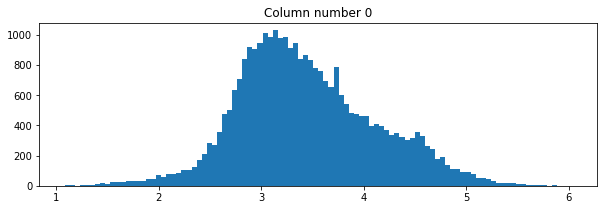

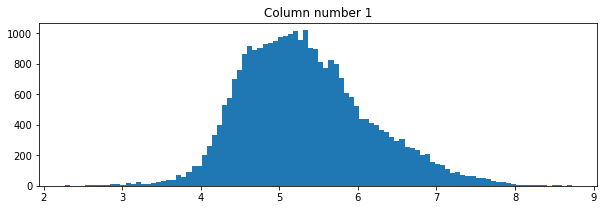

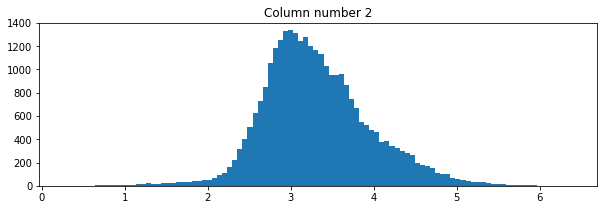

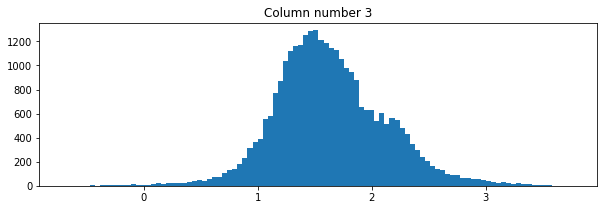

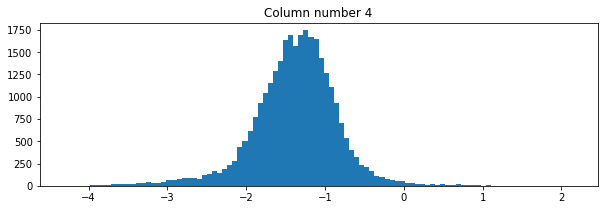

...

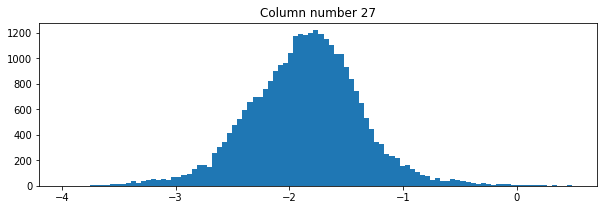

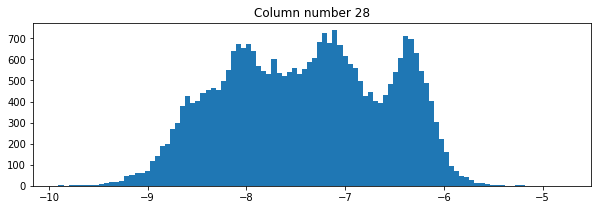

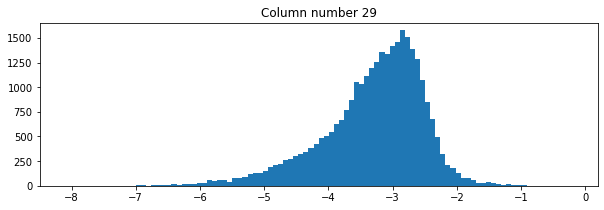

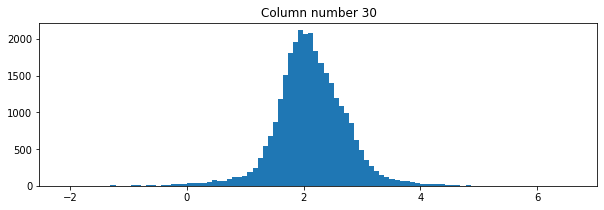

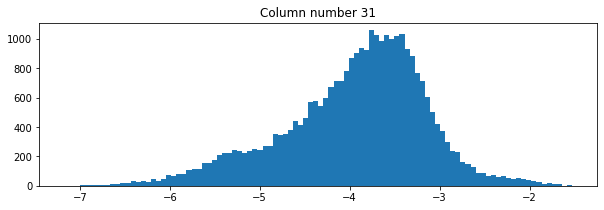

In [13]:
for idx in range(test_latent_arr.shape[1]):
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot(111)
    ax.hist(test_latent_arr[:,idx], bins=100)
    ax.set_title("Column number {}".format(idx))
    plt.show()

# Clustering

In [14]:
from sklearn.cluster import KMeans

In [15]:
kmeans = KMeans(n_clusters=20, random_state=0).fit(train_latent_arr)

In [16]:
print(np.unique(kmeans.labels_))
print(len(kmeans.labels_))

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]
29984


In [17]:
for_see = np.load('/works/Data/wellysis/preprocessed/5s_mit_minmax_30000_train.npy')[:29984]

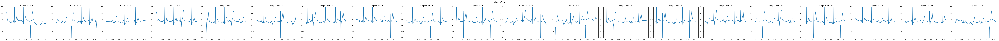

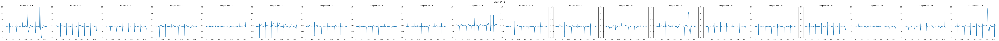

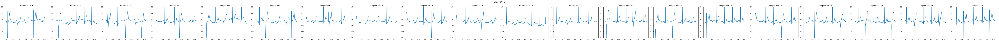

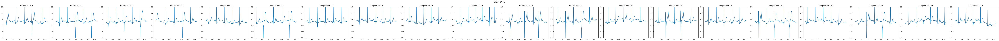

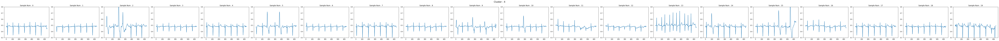

...

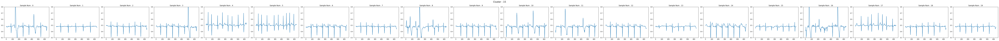

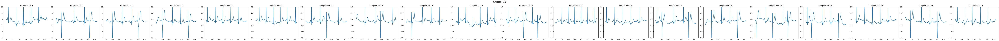

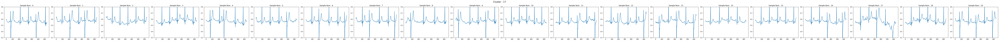

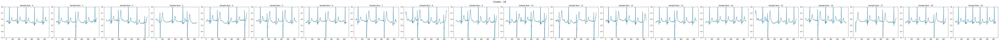

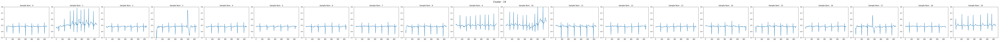

In [18]:
for i in range(len(np.unique(kmeans.labels_))):
    sample = for_see[kmeans.labels_ == i]
    sample = sample[np.random.permutation(len(sample))[:20]]
    sample = tf.convert_to_tensor(sample, dtype=tf.float32)
    outputs, latents = model(sample)
    outputs = outputs.numpy()
    fig = plt.figure(figsize=(len(outputs)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(outputs))
    for idx, ax in enumerate(axs):
        arr = outputs[idx].reshape(-1)
        ax.plot(np.arange(len(arr)), arr)
        ax.set_title("Sample Num : {}".format(idx))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('Cluster : {}'.format(i), fontsize=16)
    plt.show()

# PCA

In [20]:
from sklearn.decomposition import PCA

In [21]:
pca = PCA(n_components=2)
printcipalComponents_latent = pca.fit_transform(train_latent_arr)

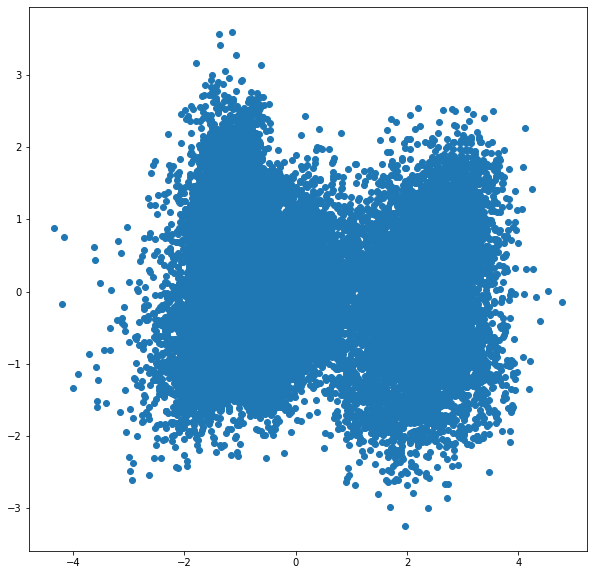

In [22]:
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111)
ax.scatter(printcipalComponents_latent[:,0], printcipalComponents_latent[:,1])
plt.show()

In [35]:
def return_pca(nums, arr):
    pca = PCA(n_components=nums)
    printcipalComponents_mu = pca.fit_transform(arr)
    return pca

def make_zsample_use_pca(pca_vactor, pca):
    return (np.array(pca_vactor).reshape(-1,1) * pca.components_).sum(axis=0)

pca_num = 10

pca = return_pca(pca_num, train_latent_arr)

In [36]:
ratio = pca.explained_variance_ratio_
ratio

array([0.30986324, 0.09859251, 0.0808038 , 0.07049035, 0.05825632,
       0.04895381, 0.0452926 , 0.04310713, 0.03784897, 0.03227089],
      dtype=float32)

In [38]:
train_latent_pca_arr = pca.transform(train_latent_arr)
print(train_latent_pca_arr.shape)

(29984, 10)


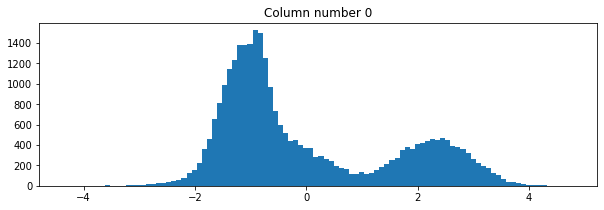

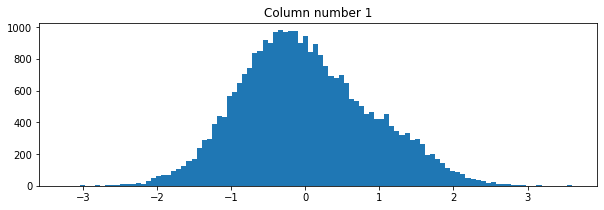

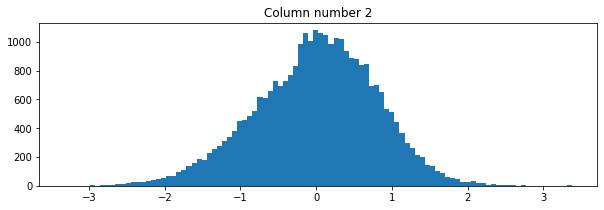

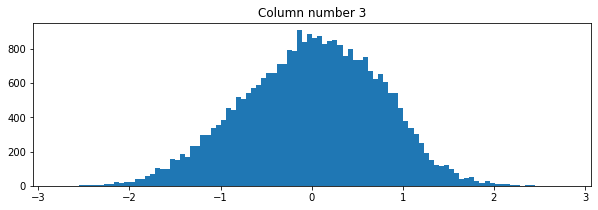

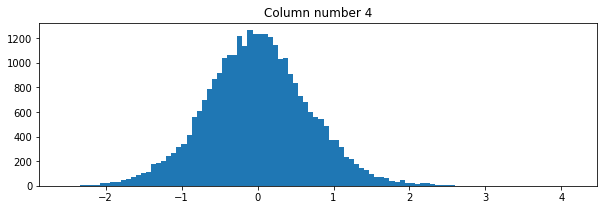

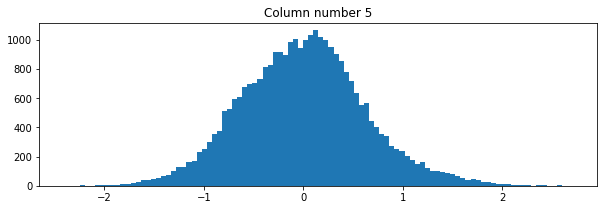

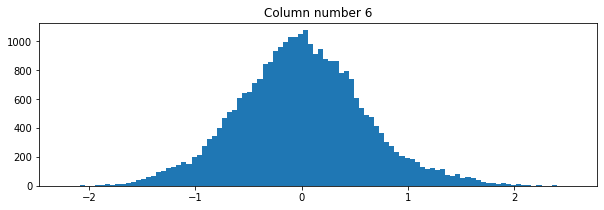

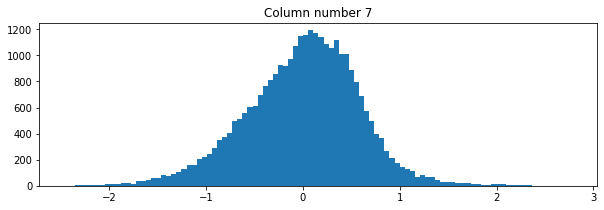

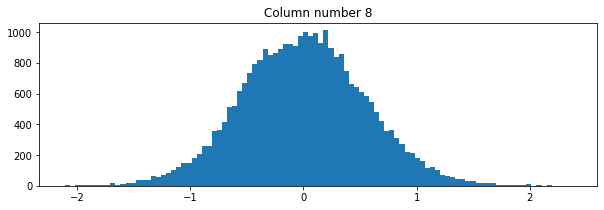

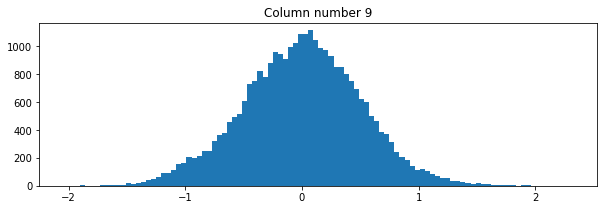

In [39]:
for idx in range(train_latent_pca_arr.shape[1]):
    fig = plt.figure(figsize=(10,3))
    ax = fig.add_subplot(111)
    ax.hist(train_latent_pca_arr[:,idx], bins=100)
    ax.set_title("Column number {}".format(idx))
    plt.show()

In [44]:
DL_input = tf.keras.Input(model.layers[2].input_shape[1:])
DL_model = DL_input
DL_model = model.layers[2](DL_model)
DL_model = tf.keras.Model(inputs=DL_input, outputs=DL_model)
DL_model.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 32)]              0         
_________________________________________________________________
Decoder_Module (Functional)  (None, 640, 1)            2550545   
Total params: 2,550,545
Trainable params: 2,550,545
Non-trainable params: 0
_________________________________________________________________


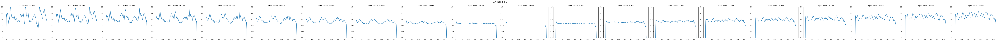

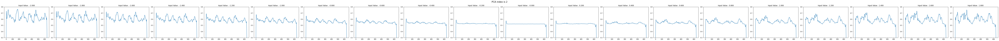

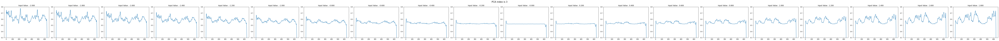

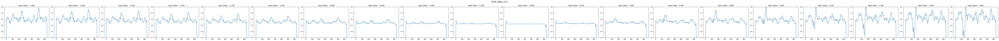

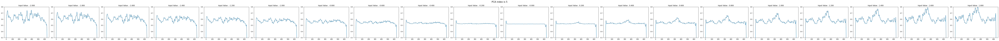

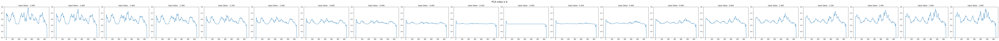

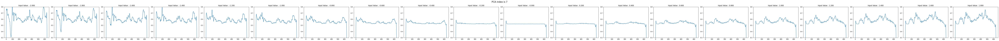

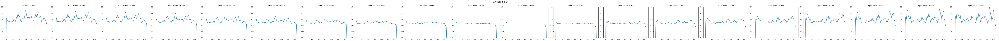

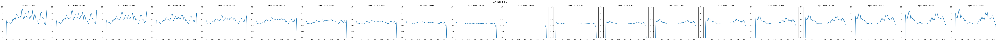

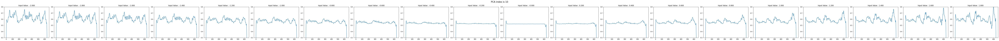

In [46]:
sample_data = np.arange(-2, 2, 0.2)

for pca_idx in range(pca_num):
    fig = plt.figure(figsize=(len(sample_data)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(sample_data))
    for idx, ax in enumerate(axs):
        pca_default = np.zeros((pca_num), dtype=np.float32)
        pca_default[pca_idx] = sample_data[idx]
        for_input_mu = make_zsample_use_pca(pca_default, pca).reshape(1,32)
        outs = DL_model(for_input_mu).numpy()[0,:,0]
        ax.plot(np.arange(len(outs)), outs)
        ax.set_title("Input Value : {:.3f}".format(sample_data[idx]))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('PCA index is {}'.format(pca_idx+1), fontsize=16)
    plt.show()

# Latent 값 변형 관찰

[ 2.503446   5.337193   2.9721363  1.673642  -1.2803606  2.2641602
 -4.2157254  2.2036414 -2.9038167 -3.9894357  9.686277   1.2668672
  3.006088  -6.0703053  3.546705  -1.7294883  0.4597655  1.6252904
  1.6850054  2.77443   -3.2201817 -1.5857396  3.030365  -1.3451738
  2.5386438 -3.7208104 -1.3029065 -2.2790346 -7.8553786 -4.002631
  1.5601484 -3.7564607]


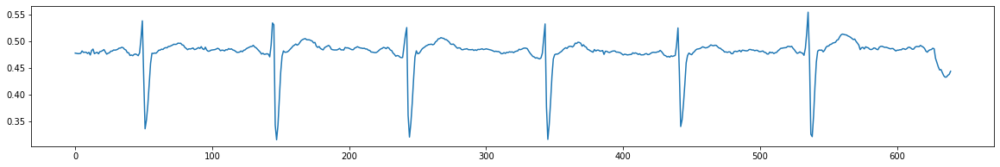

In [91]:
target_num = 10
outputs = DL_model(train_latent_arr[target_num:target_num+2]).numpy()[0].reshape(-1)
sample_latent = train_latent_arr[target_num].copy()
print(sample_latent)

fig = plt.figure(figsize=(20,3))
ax = fig.add_subplot(111)
ax.plot(outputs)
plt.show()

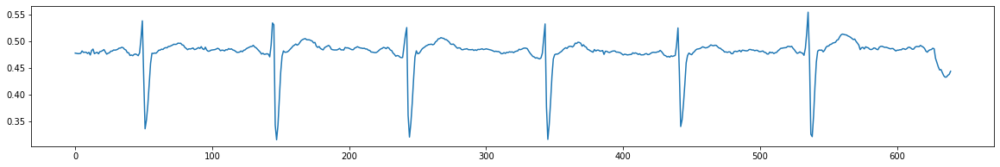

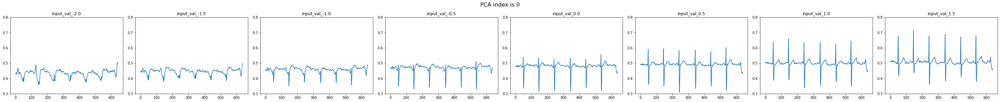

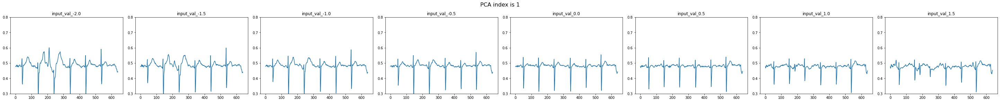

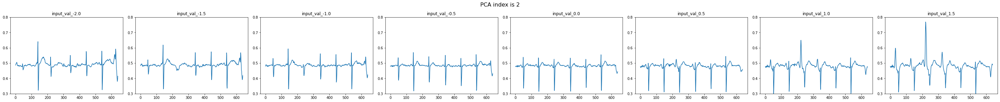

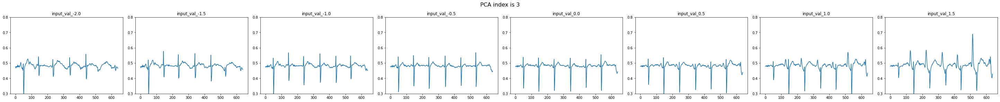

...

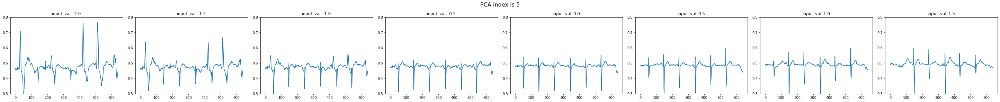

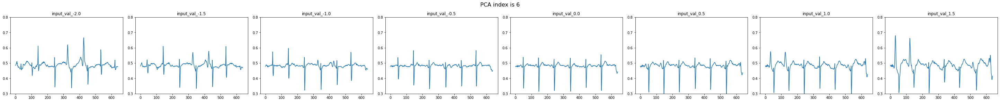

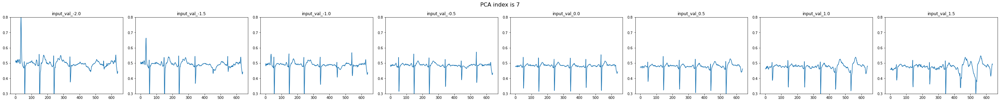

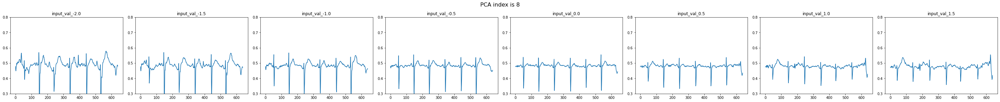

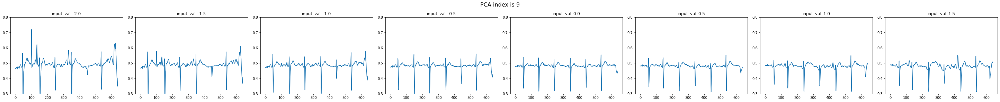

In [92]:
fig = plt.figure(figsize=(20,3))
ax = fig.add_subplot(111)
ax.plot(outputs)
plt.show()

sum_num_list = np.arange(-2, 2, 0.5)
for pca_idx in range(pca_num):
    fig = plt.figure(figsize=(len(sum_num_list)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(sum_num_list))
    for idx, ax in enumerate(axs):
        base_arr = np.zeros((1,32), dtype=np.float32)
        cop_arr = sample_latent.copy()
        cop_arr += (pca.components_[pca_idx]*sum_num_list[idx])
        concat_arr = np.concatenate((cop_arr.reshape(-1,32), base_arr), axis=0)
        output_arr = DL_model(concat_arr).numpy()[0].reshape(-1)
        
        ax.plot(np.arange(len(output_arr)), output_arr)
        ax.set_title("input_val_{}".format(sum_num_list[idx]))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('PCA index is {}'.format(pca_idx), fontsize=16)
    plt.show()

# PCA 후 클러스터링

In [126]:
def make_latent_set(model, data_set):
    base_arr = np.zeros((1, 32), dtype=np.float32)
    for x in data_set:
        outputs, latent = model(x)
        latent_arr = latent.numpy()
        base_arr = np.concatenate((base_arr, latent_arr), axis=0)
    base_arr = base_arr[1:]
    print(base_arr.shape)
    return base_arr

In [127]:
sample_person = np.load('/works/Data/wellysis/preprocessed/5s_mit_num1.npy')
sample_person_tensor = tensorset(arr = sample_person, shape=(-1, time_size, 1), batch_size=batch_size)
sample_person_latents = make_latent_set(model, sample_person_tensor)

Before reshape : (28199, 640, 1)
After reshape : (28199, 640, 1) | data type : float32
(28192, 32)


In [167]:
pca_num = 10

pca = return_pca(pca_num, train_latent_arr)

In [168]:
sample_person_latents_pca = pca.transform(sample_person_latents)

In [169]:
kmeans = KMeans(n_clusters=5, random_state=0).fit(sample_person_latents_pca)
print(np.unique(kmeans.labels_))
print(len(kmeans.labels_))
for_see = np.load('/works/Data/wellysis/preprocessed/5s_mit_num1.npy')[:len(sample_person_latents)]
print(for_see.shape)

[0 1 2 3 4]
28192
(28192, 640, 1)


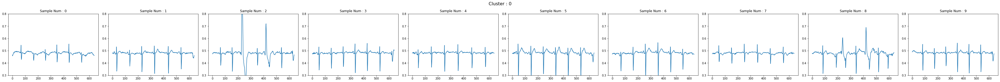

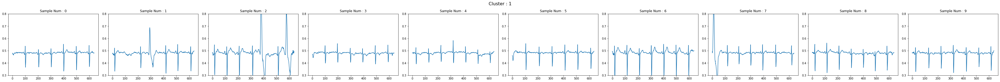

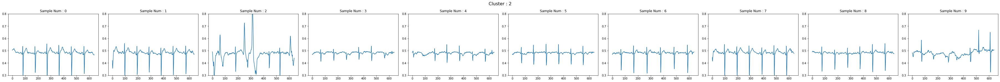

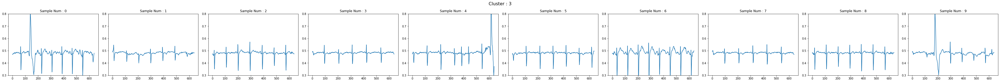

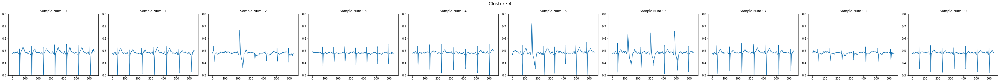

In [170]:
for i in range(len(np.unique(kmeans.labels_))):
    sample = for_see[kmeans.labels_ == i]
    sample = sample[np.random.permutation(len(sample))[:10]]
    sample = tf.convert_to_tensor(sample, dtype=tf.float32)
    outputs, latents = model(sample)
    outputs = outputs.numpy()
    fig = plt.figure(figsize=(len(outputs)*5,4), constrained_layout=True)
    axs = fig.subplots(1, len(outputs))
    for idx, ax in enumerate(axs):
        arr = outputs[idx].reshape(-1)
        ax.plot(np.arange(len(arr)), arr)
        ax.set_title("Sample Num : {}".format(idx))
        ax.set(ylim=(0.3, 0.8))
    fig.suptitle('Cluster : {}'.format(i), fontsize=16)
    plt.show()